# EDA Project-Analysis of AMCAT Data

### The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate

In [45]:
#import neccessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from scipy.stats import chi2_contingency

In [46]:
#Read data
data=pd.read_csv("data.xlsx - Sheet1.csv")

In [47]:
#showing 5 rows only
data.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [48]:
# row and columns of data
data.shape

(3998, 39)

In [49]:
data.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


# univariate analysis

In [50]:
numerical_columns=data.select_dtypes(include=['float64','int64'])

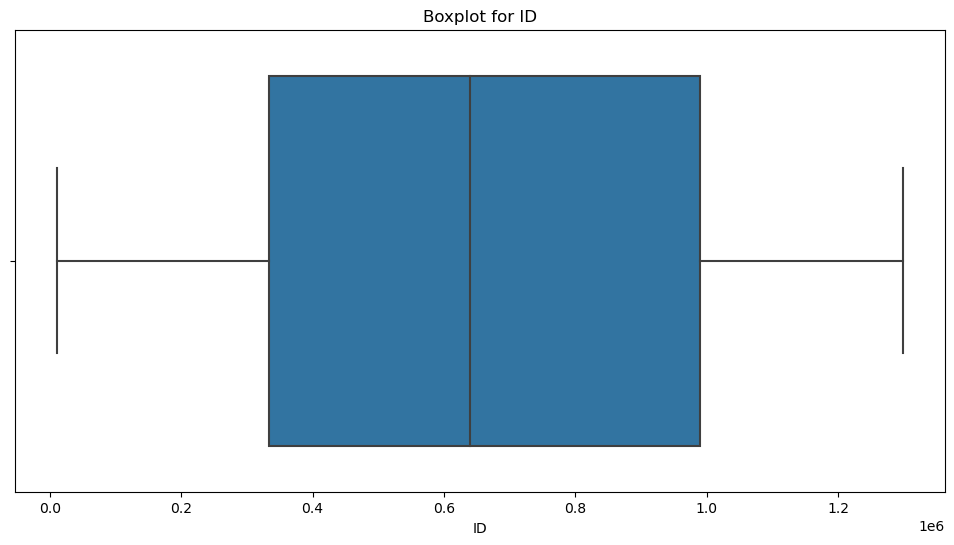

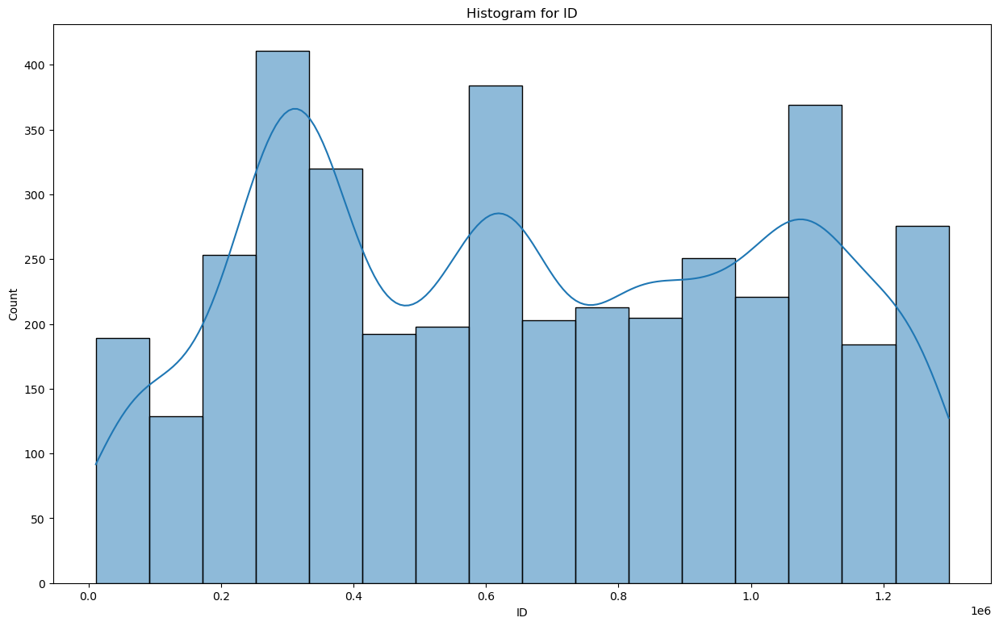

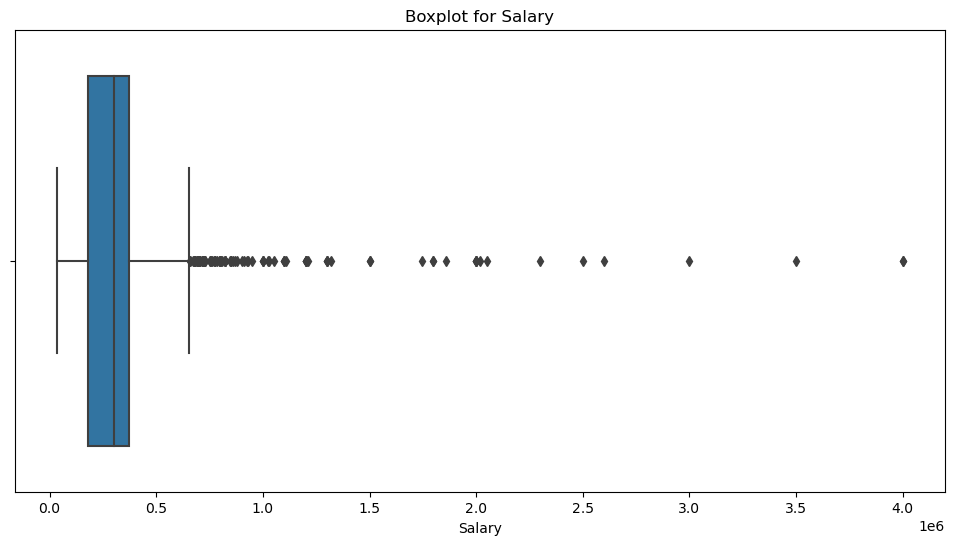

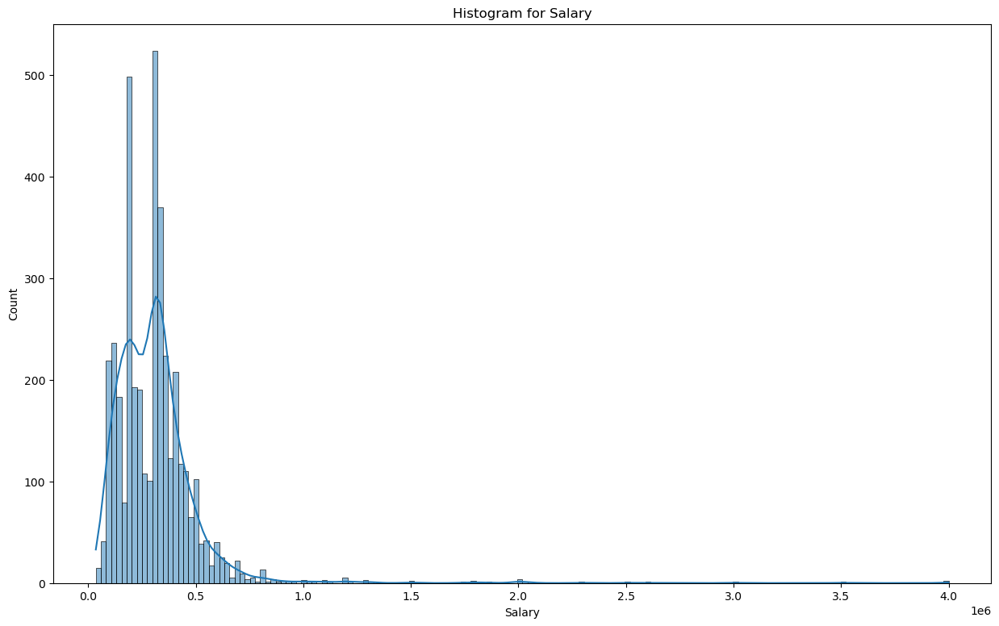

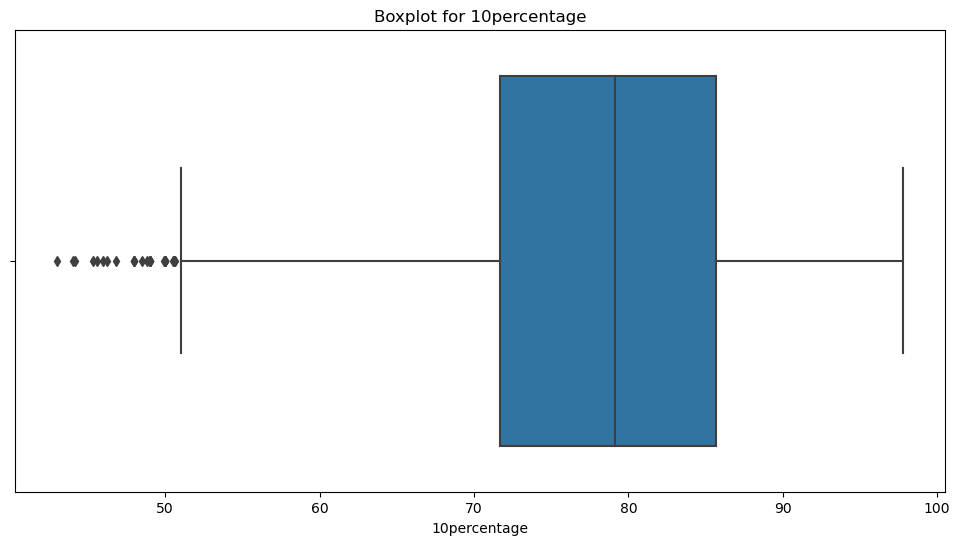

...

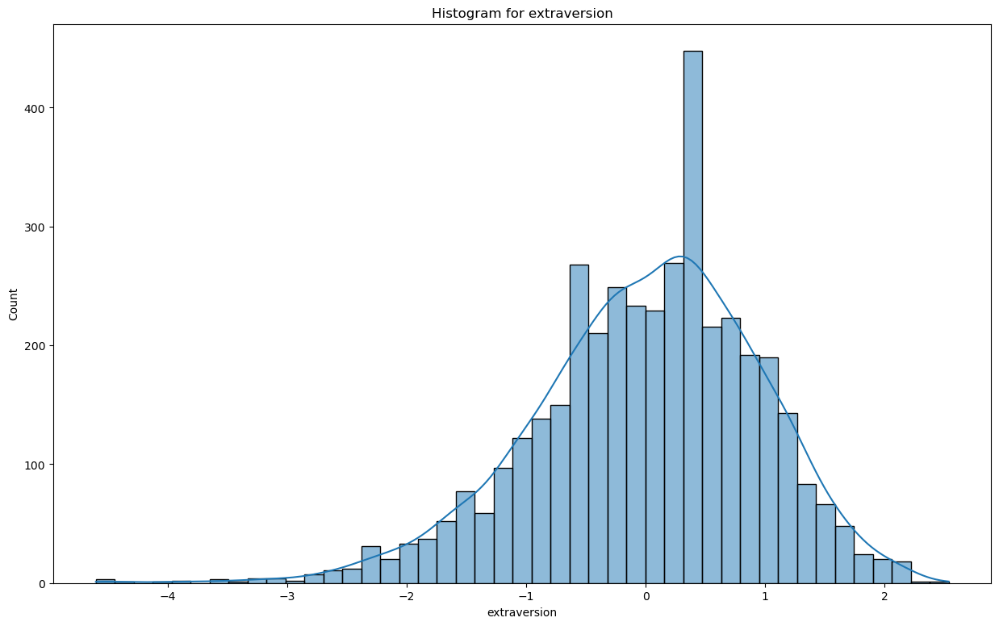

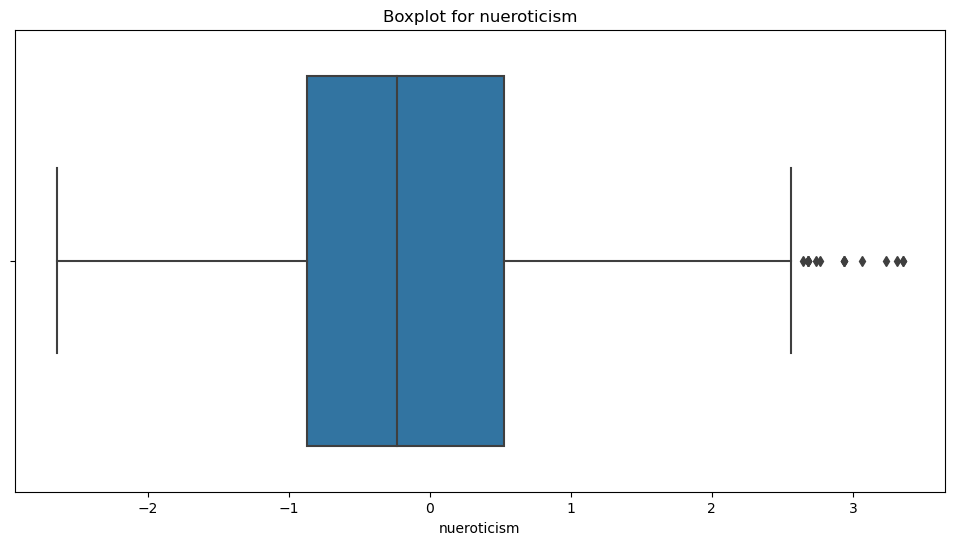

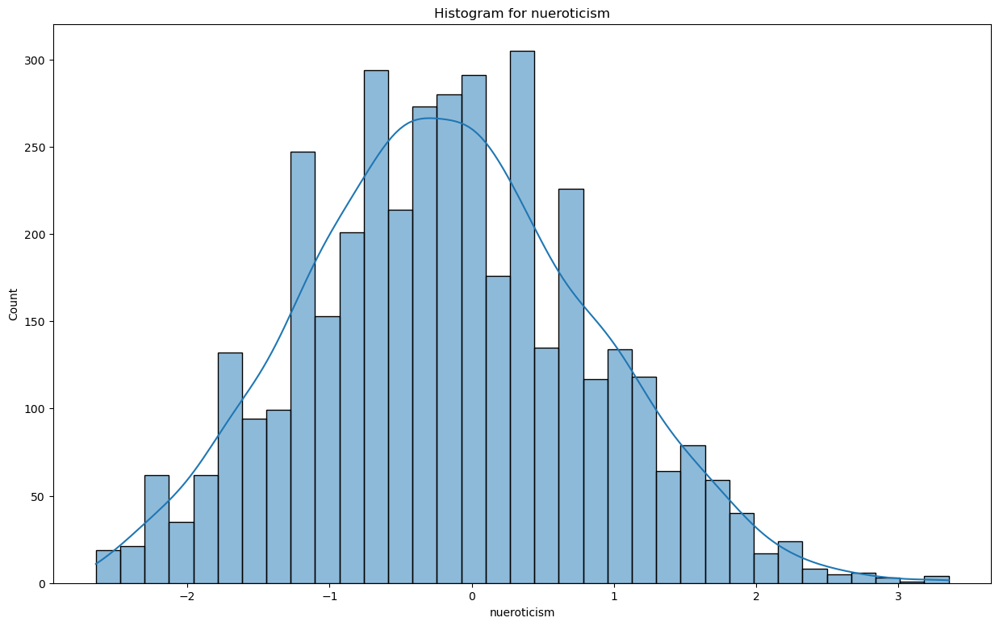

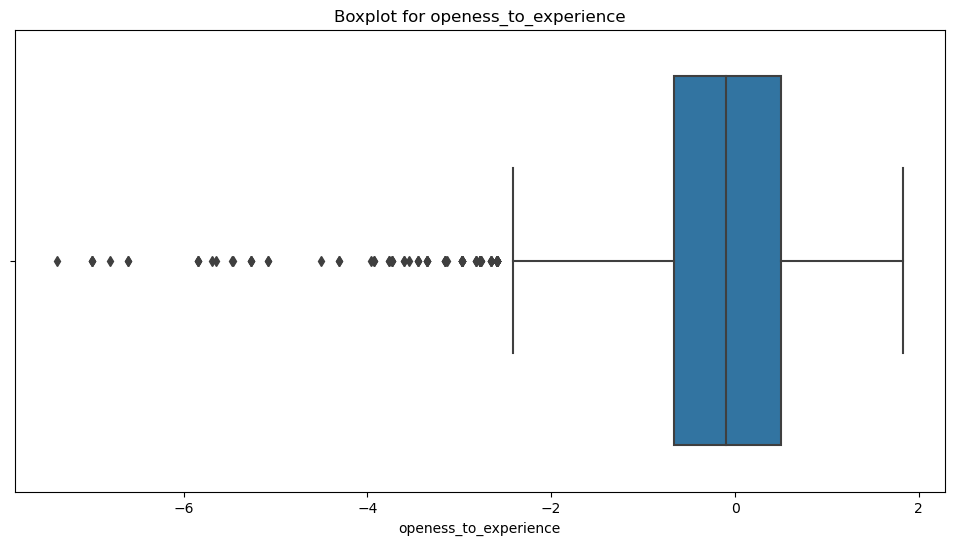

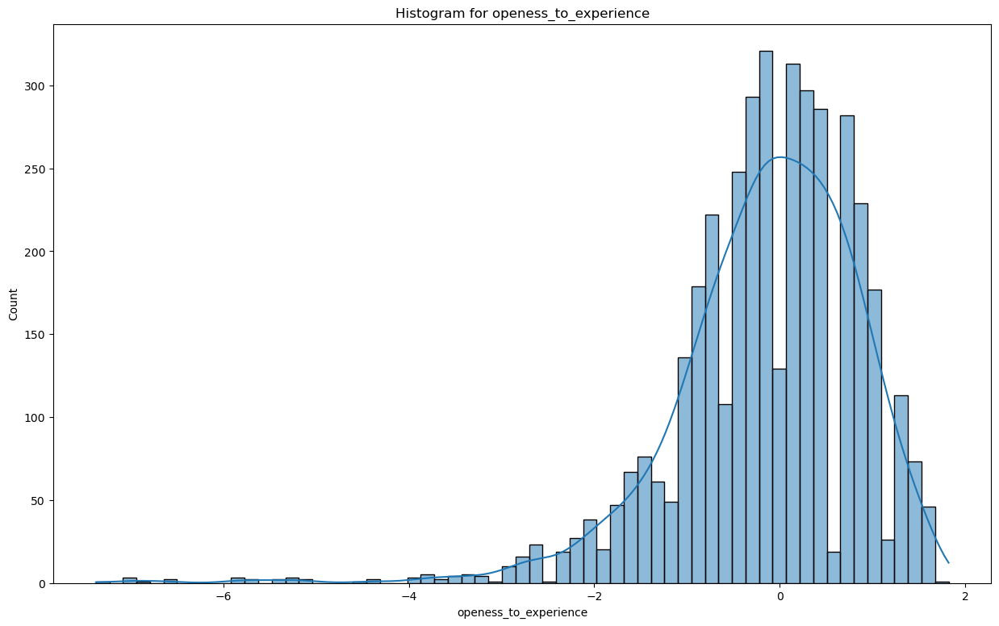

In [51]:
# Identify outliers in each numerical column
for column in numerical_columns:
    plt.figure(figsize=(12, 6))

    # Boxplot to visualize outliers
    sns.boxplot(x=data[column])
    plt.title(f'Boxplot for {column}')
    plt.show()

    # Histogram to visualize the distribution
    plt.figure(figsize=(15, 9))
    sns.histplot(data[column], kde=True)
    plt.title(f'Histogram for {column}')
    plt.show()

From these visualisations<br>
*Most of the salaries are between 100000 and 1000000.<br>
*Most of the persons have around 90%.(left skewed distribution)<br>
*most number of persons are graduate 12th in between 2007 and 2010<br>
*The histogram plot of 12percentage is slightly leftskewed(very slight).most ofthe person have 70%on their 12th.<br>
*most of the students are from tier 2 colleges.<br>
*most of the students 70-80 CGPA on their college and they graduated in around 2000s.<br>

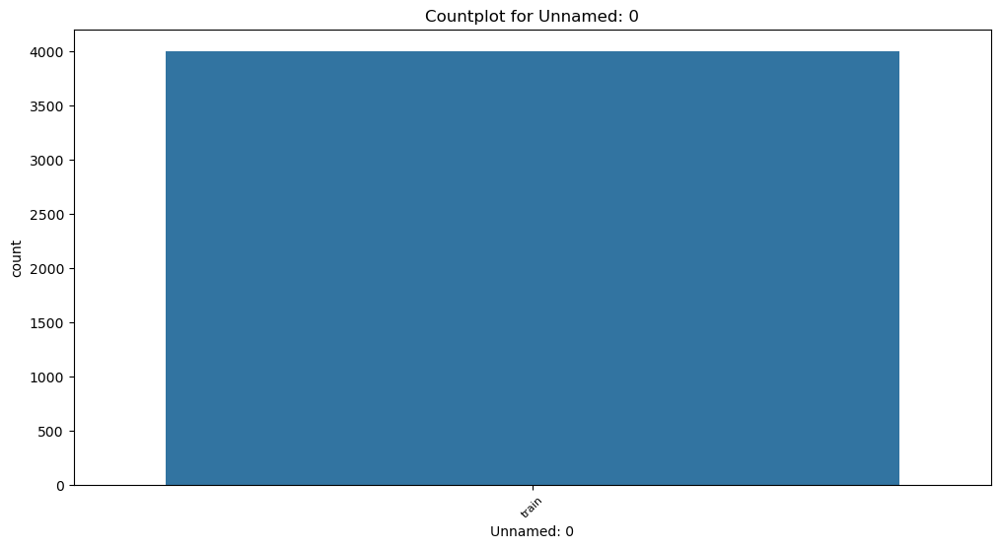

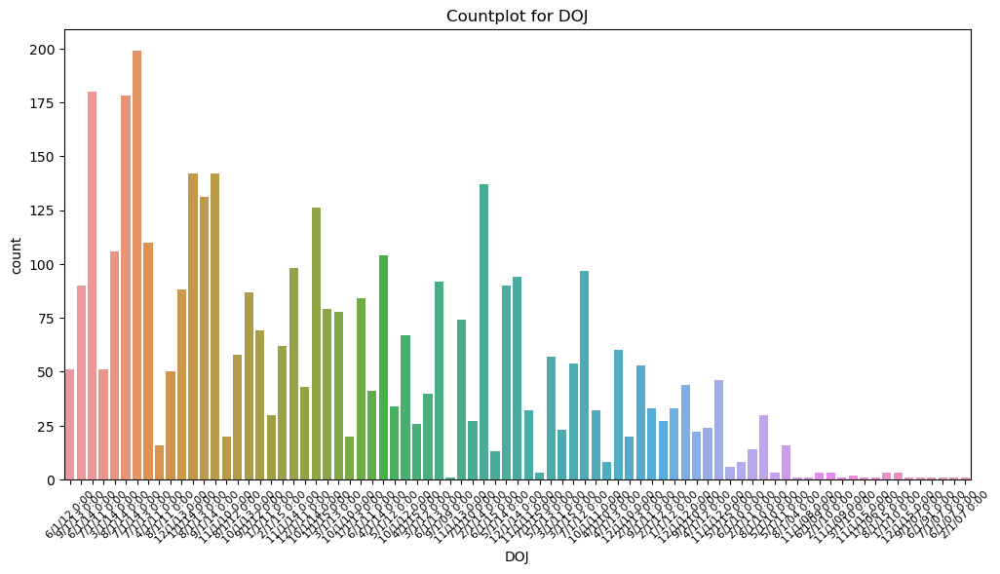

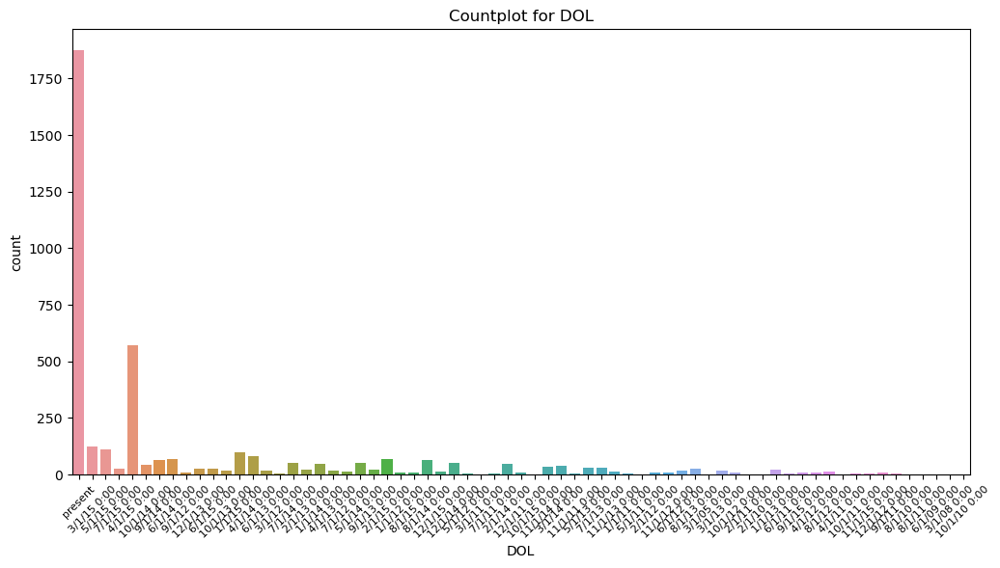

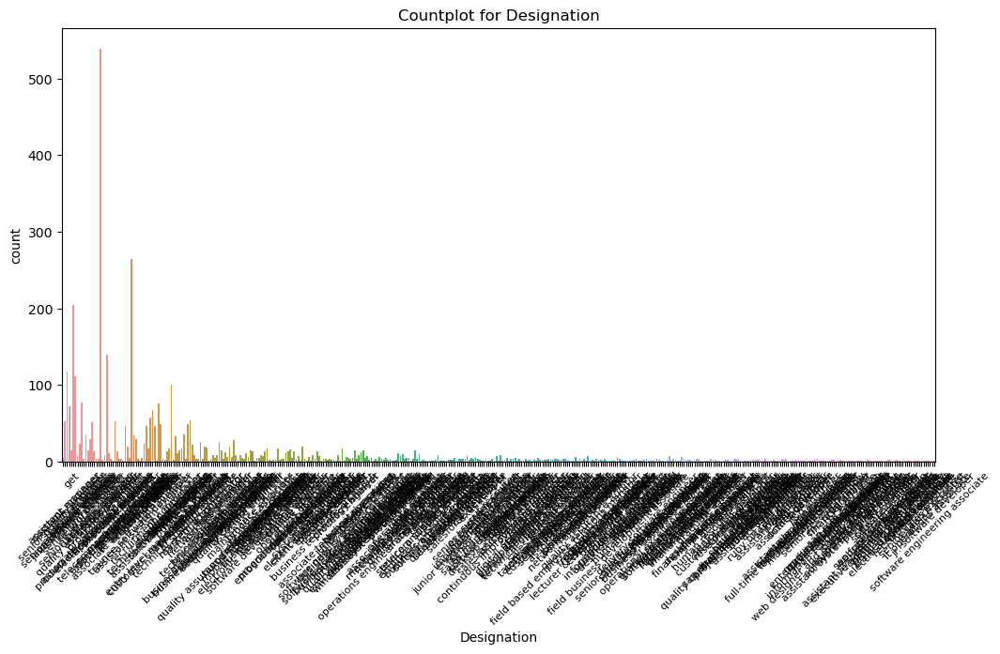

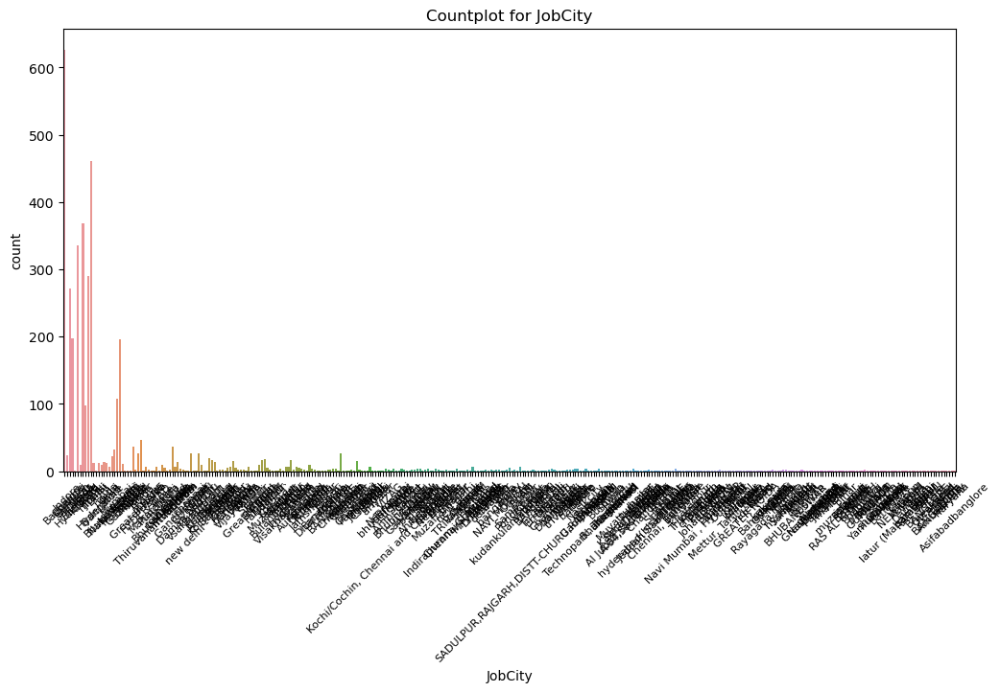

...

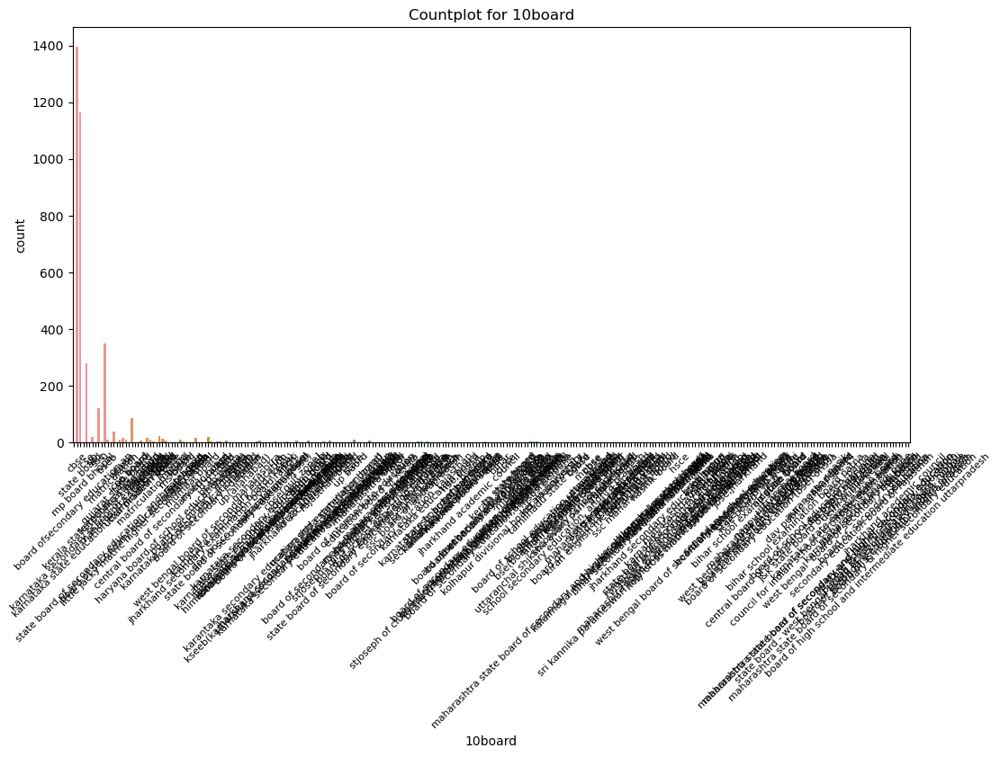

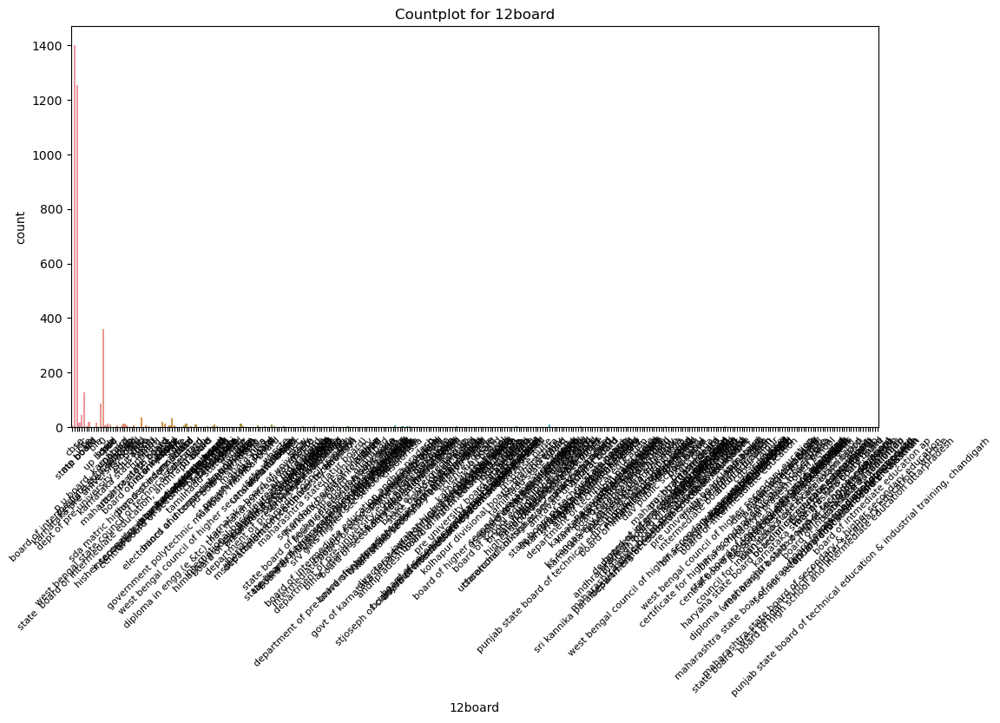

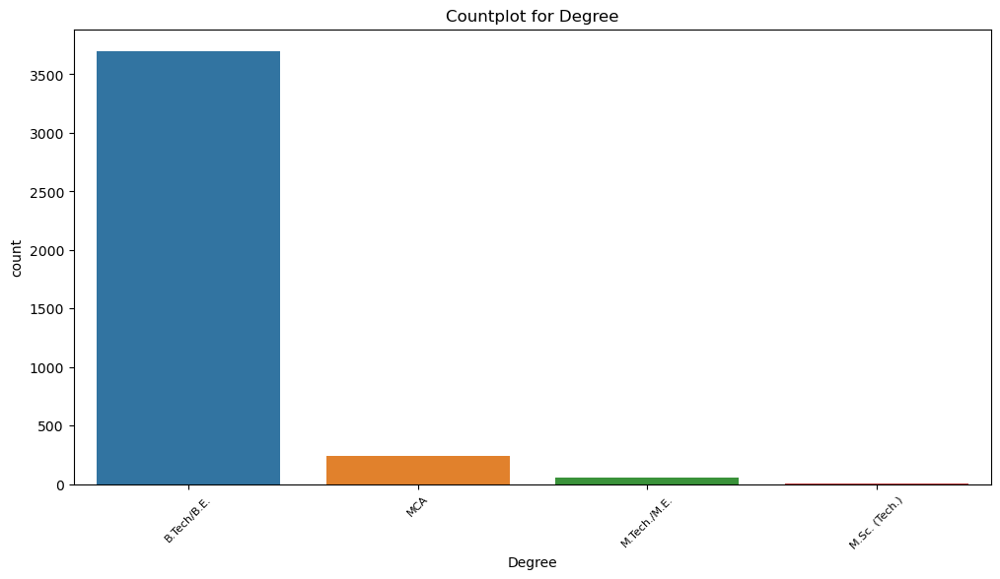

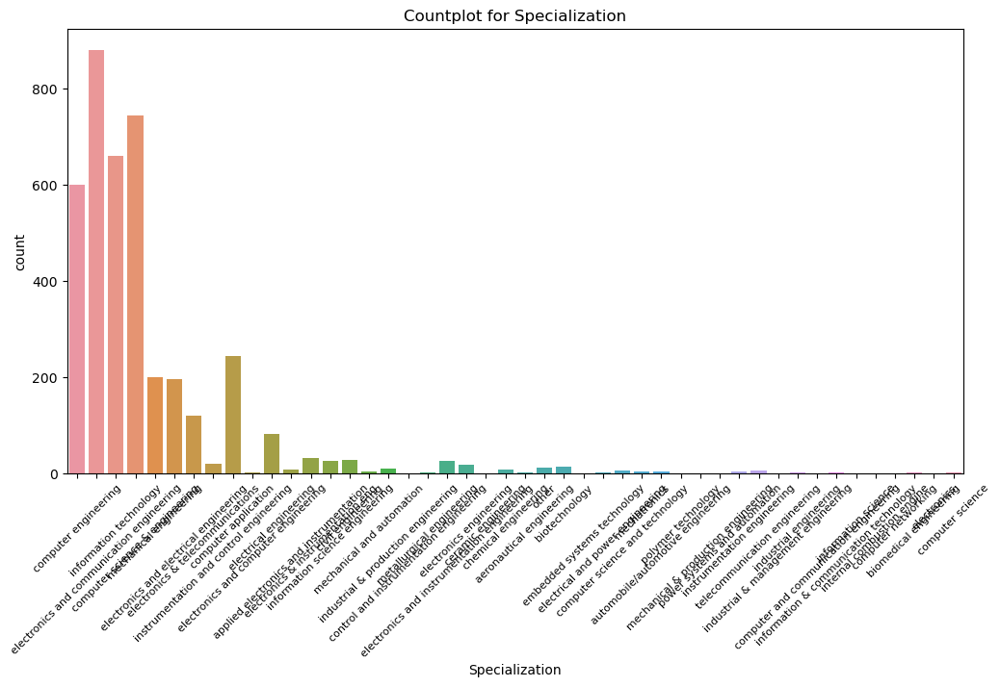

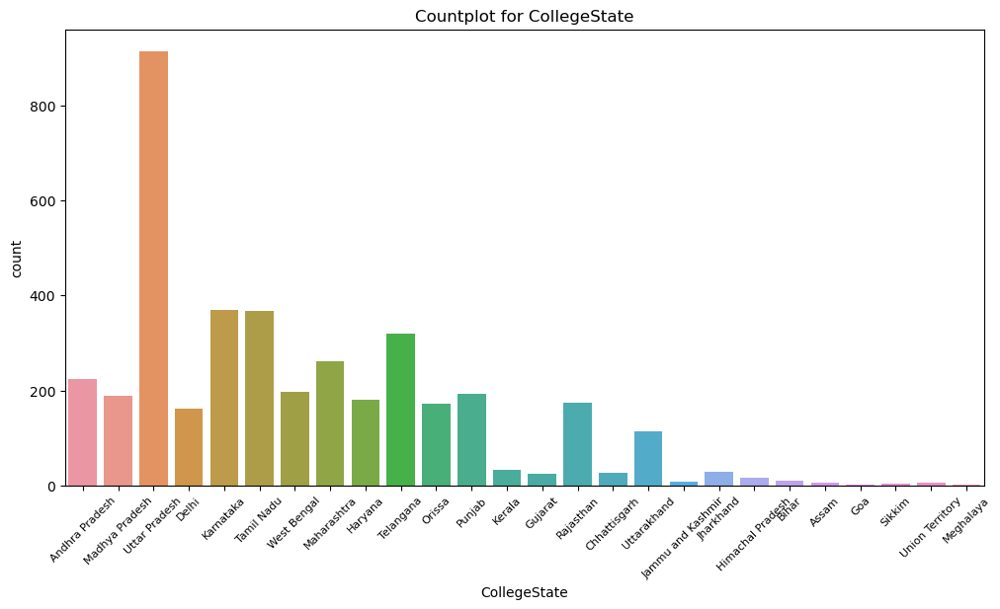

In [52]:
# Univariate analysis for categorical columns
categorical_columns = data.select_dtypes(include='object').columns

# Countplot to visualize frequency distribution of each categorical variable
for column in categorical_columns:
    plt.figure(figsize=(12, 6))
    sns.countplot(x=data[column])
    plt.title(f'Countplot for {column}')
    plt.xticks(fontsize=8)
    plt.xticks(rotation=45)
    plt.show()

From These visualisations<br>
*Most of the students are joined in a company on 7-01-2014 and most ofthem are currently working on that company.<br>
*Most of them are software engineer and most persons are work in Bangalore and the large number of  trainees are male.<br>
*The prsons have b-tech or B.E background<br>
*most peoples are from electronics and communication engineering<br>
*Most students are completed their graduation in Uttar Pradesh

C:\Users\HP\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


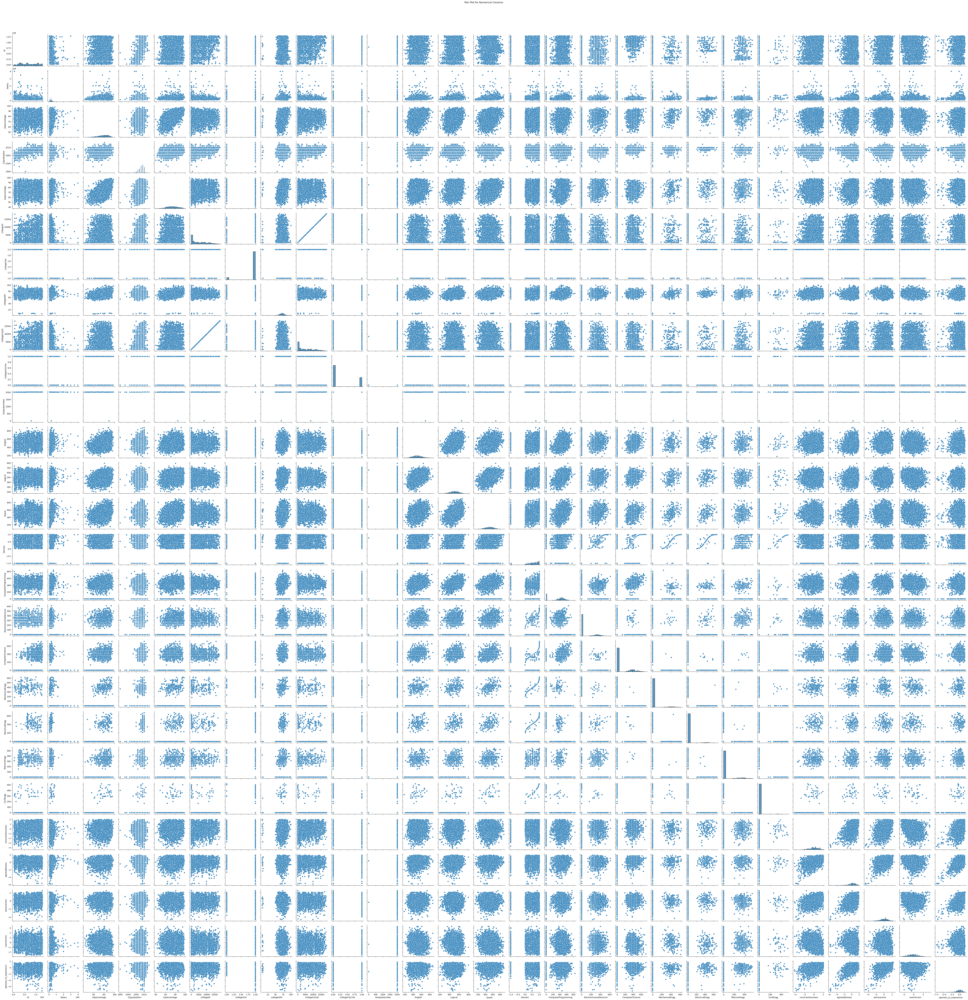

In [53]:
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Scatter plot matrix (pair plot) for numerical columns
sns.pairplot(data[numerical_columns])
plt.suptitle('Pair Plot for Numerical Columns', y=1.02)
plt.show()

In [54]:
claimed_roles = ['Programming Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']

In [55]:
# Filter the dataset for the claimed roles
claimed_roles_data = data[data['Designation'].isin(claimed_roles)]

# Extract the salary data for the claimed roles
claimed_roles_salaries = claimed_roles_data['Salary']

# Define the claimed salary range
claimed_salary_range = (2.5, 3)

# Test the claim using a t-test
t_statistic, p_value = ttest_ind(claimed_roles_salaries, claimed_salary_range)

# Check if the p-value is less than a significance level (e.g., 0.05)
if p_value < 0.05:
    print(f"The claim is rejected. The average salary is significantly different from the claimed range.")
else:
    print("The claim cannot be rejected. The average salary is within the claimed range")

The claim cannot be rejected. The average salary is within the claimed range


In [56]:
contingency_table = pd.crosstab(data['Gender'], data['Specialization'])

# Perform the chi-squared test for independence
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

# Check if the p-value is less than a significance level (e.g., 0.05)
if p_value < 0.05:
    print(f"There is a significant relationship between gender and specialization.")
else:
    print("There is no significant relationship between gender and specialization.")

There is a significant relationship between gender and specialization.


# Conclusion

### The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited only to students with engineering disciplines.So most of the students have b.tech background.Few students are completed their degree in tier-1 colleges.Most of the Students have 70-80% on their 12th and degree.Eventhough Most of them are earn high salary as other 90% above marked students.Females and males have no difference in getting their specialization.They do their Specialisation based on their passion.